In [ ]:
# ── CELL 1: Install dependencies ──────────────────────────
!pip install ultralytics -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 80.2 MB/s eta 0:00:00


In [ ]:
# ── CELL 2: Enable GPU — RUN THIS FIRST, then check ───────
import torch
print("CUDA available:", torch.cuda.is_available())
print("GPU:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "❌ No GPU — Go to Runtime > Change runtime type > T4 GPU, then restart!")


CUDA available: True
GPU: Tesla T4


In [ ]:

# ── CELL 3: Mount Google Drive ────────────────────────────
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
# ── CELL 4: Extract ZIP from Drive ────────────────────────
import zipfile, os

# Update this path if your file is in a subfolder inside Drive
ZIP_PATH = "/content/drive/MyDrive/pcb whole images.yolov8.zip"
EXTRACT_DIR = "/content/dataset"

os.makedirs(EXTRACT_DIR, exist_ok=True)

with zipfile.ZipFile(ZIP_PATH, 'r') as z:
    z.extractall(EXTRACT_DIR)

print("✅ Extracted successfully!")


✅ Extracted successfully!


In [ ]:
import yaml, os, glob

YAML_PATH = f"{EXTRACT_DIR}/data.yaml"

# Find actual image folders
train_path = f"{EXTRACT_DIR}/train/images"
valid_path  = f"{EXTRACT_DIR}/valid/images"
val_path    = f"{EXTRACT_DIR}/val/images"
test_path   = f"{EXTRACT_DIR}/test/images"

# Use whichever val folder exists; fall back to train if neither does
if os.path.exists(valid_path):
    val_dir = valid_path
elif os.path.exists(val_path):
    val_dir = val_path
else:
    print("⚠️  No val split found — using train set for validation")
    val_dir = train_path

with open(YAML_PATH, 'r') as f:
    data = yaml.safe_load(f)

data['train'] = train_path
data['val']   = val_dir
data['test']  = test_path if os.path.exists(test_path) else val_dir

with open(YAML_PATH, 'w') as f:
    yaml.dump(data, f)

print("✅ data.yaml updated:")
print(f"  train : {data['train']}")
print(f"  val   : {data['val']}")
print(f"  test  : {data['test']}")
print(f"  nc    : {data['nc']}")
print(f"  names : {data['names']}")

⚠️  No val split found — using train set for validation
✅ data.yaml updated:
  train : /content/dataset/train/images
  val   : /content/dataset/train/images
  test  : /content/dataset/train/images
  nc    : 1
  names : ['pcb-whole-images']


In [ ]:
# ── CELL 6: Train YOLOv8 ──────────────────────────────────
from ultralytics import YOLO

device = 0 if torch.cuda.is_available() else 'cpu'
print(f"Training on: {'GPU ✅' if device == 0 else 'CPU ⚠️ (will be slow!)'}")

model = YOLO("yolov8n.pt")

results = model.train(
    data=YAML_PATH,
    epochs=30,
    imgsz=256,
    batch=16,        # lower to 8 if OOM error on GPU
    name="pcb_run",
    project="/content/runs",
    patience=20,
    device=device,
    plots=True,
)

print("✅ Training complete!")

Training on: GPU ✅
Ultralytics 8.4.46 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/dataset/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=256, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=pcb_run-4, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=Tr

In [ ]:
# ── CELL 7: Evaluate ──────────────────────────────────────
metrics = model.val()
print(f"mAP50:     {metrics.box.map50:.4f}")
print(f"mAP50-95:  {metrics.box.map:.4f}")
print(f"Precision: {metrics.box.p.mean():.4f}")
print(f"Recall:    {metrics.box.r.mean():.4f}")

Ultralytics 8.4.46 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Model summary (fused): 73 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3096.3±1479.6 MB/s, size: 7435.1 KB)
val: Scanning /content/dataset/train/labels.cache... 45 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 45/45 13.5Mit/s 0.0s
train: /content/dataset/train/images/IMG20260325163641_jpg.rf.umFlxzyez3gJ26e6FQGC.jpg: corrupt JPEG restored and saved
train: /content/dataset/train/images/IMG20260325163717_jpg.rf.krpjr6MQMyu2Ry1gW8ii.jpg: corrupt JPEG restored and saved
train: /content/dataset/train/images/IMG20260325163818_jpg.rf.qKUUQY1c5gCdd4DYQkTz.jpg: corrupt JPEG restored and saved
train: /content/dataset/train/images/IMG20260325163819_jpg.rf.J0Dt83vQMbK1yc4E7pNP.jpg: corrupt JPEG restored and saved
train: /content/dataset/train/images/IMG20260325163848_jpg.rf.Mfc6Pxq6M6WqO8Hqx54Q.jpg: corrupt JPEG restored and saved
train: /content/datas


image 1/1 /content/dataset/train/images/IMG20260325164256_jpg.rf.NZ2N1O6TTove9dHaTPtv.jpg: 256x192 7 pcb-whole-imagess, 12.8ms
Speed: 1.6ms preprocess, 12.8ms inference, 2.5ms postprocess per image at shape (1, 3, 256, 192)
Results saved to /content/runs/inference-2


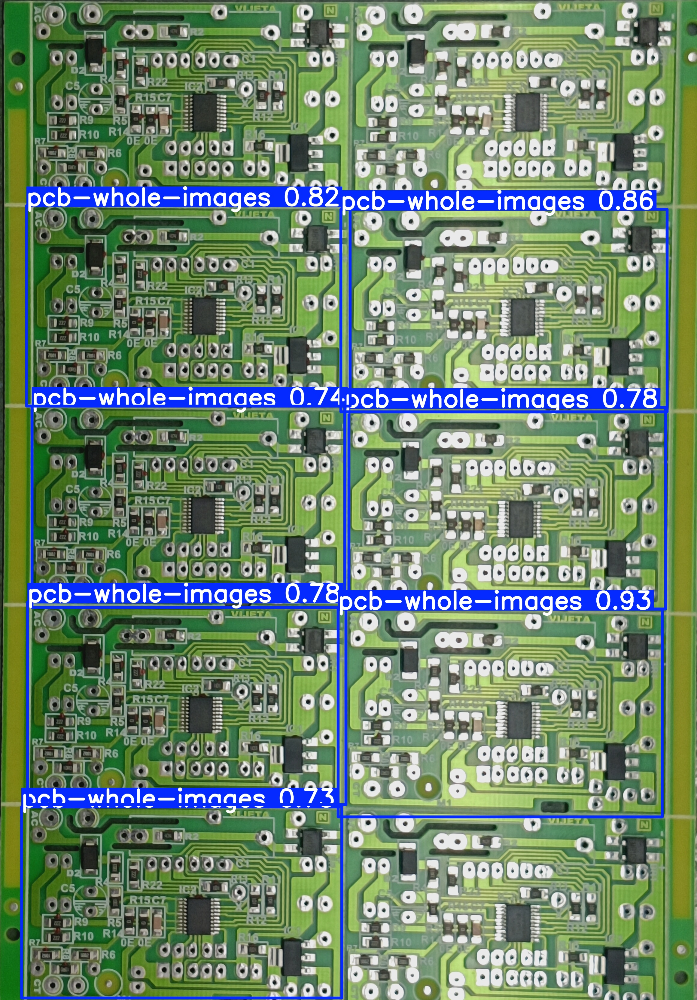

In [ ]:
# ── CELL 8: Test inference on one image ───────────────────
import glob
from IPython.display import Image, display

# Grab a random train image to test
test_images = glob.glob(f"{EXTRACT_DIR}/train/images/*.jpg")
test_img = test_images[0]

results = model.predict(test_img, save=True, conf=0.5,
                        project="/content/runs", name="inference")

saved = glob.glob("/content/runs/inference/**/*.jpg", recursive=True)
if saved:
    display(Image(saved[0]))


In [ ]:
# ── CELL 9: Save best weights back to Drive ───────────────
import shutil

best_weights = "/content/runs/pcb_run-4/weights/best.pt"
dest = "/content/drive/MyDrive/whole_pcb_images.pt"
shutil.copy(best_weights, dest)
print(f"✅ Saved to Drive: {dest}")

✅ Saved to Drive: /content/drive/MyDrive/whole_pcb_images.pt


Saving IMG20260325164348.jpg to IMG20260325164348.jpg

image 1/1 /content/IMG20260325164348.jpg: 256x192 10 pcb-whole-imagess, 6.2ms
Speed: 1.1ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 192)
Results saved to /content/runs/test_inference-2


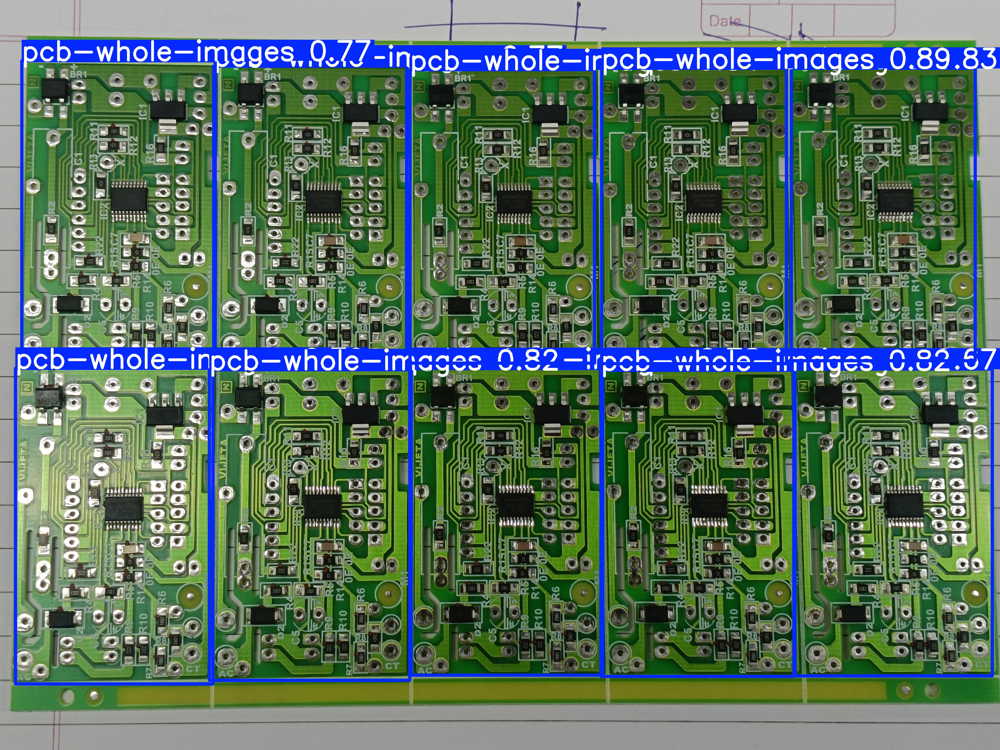

In [ ]:
# ── CELL: Test on uploaded image ──────────────────────────
from google.colab import files
from IPython.display import Image, display
import glob

# Upload image from PC
uploaded = files.upload()
img_path = list(uploaded.keys())[0]

# Run inference (model is already loaded from training)
results = model.predict(img_path, save=True, conf=0.5,
                        project="/content/runs", name="test_inference")

# Display result
saved = glob.glob("/content/runs/test_inference/**/*.jpg", recursive=True) + \
        glob.glob("/content/runs/test_inference/**/*.png", recursive=True)

if saved:
    display(Image(saved[0]))

Saving IMG20260325164348.jpg to IMG20260325164348 (2).jpg

image 1/1 /content/IMG20260325164348 (2).jpg: 256x192 10 pcb-whole-imagess, 15.5ms
Speed: 1.4ms preprocess, 15.5ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 192)
Total detections: 10

Detection 1: pcb-whole-images | conf: 0.94 | box: 1291,718 → 2438,1456
  Rotated 90° (was 1147x738, now 738x1147)
  Saved: /content/cropped_boxes/pcb-whole-images_box1_conf0.94.jpg


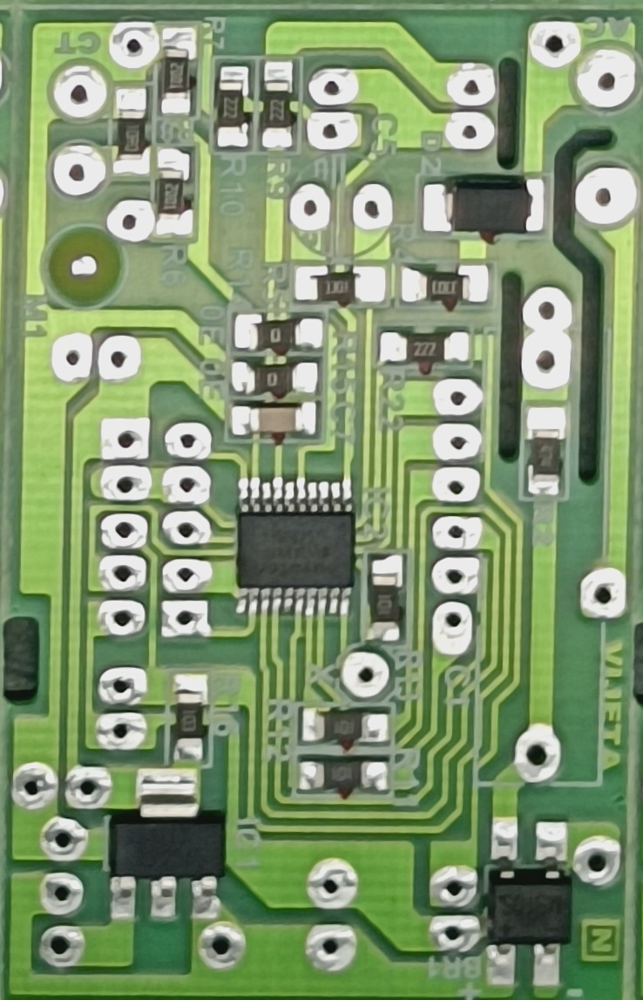

Detection 2: pcb-whole-images | conf: 0.93 | box: 1304,2153 → 2444,2886
  Rotated 90° (was 1140x733, now 733x1140)
  Saved: /content/cropped_boxes/pcb-whole-images_box2_conf0.93.jpg


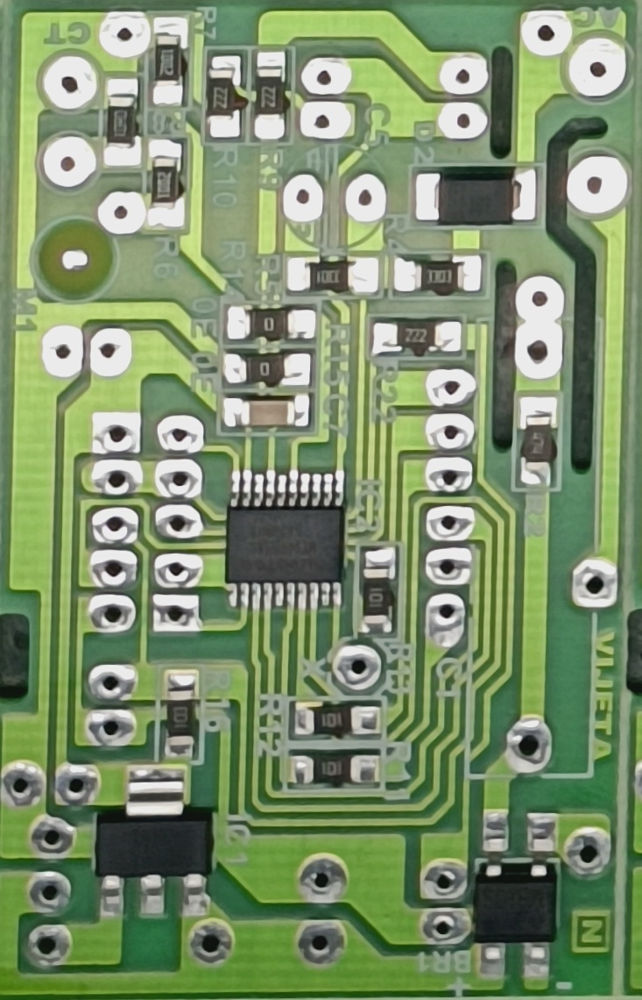

Detection 3: pcb-whole-images | conf: 0.91 | box: 1292,1461 → 2428,2171
  Rotated 90° (was 1136x710, now 710x1136)
  Saved: /content/cropped_boxes/pcb-whole-images_box3_conf0.91.jpg


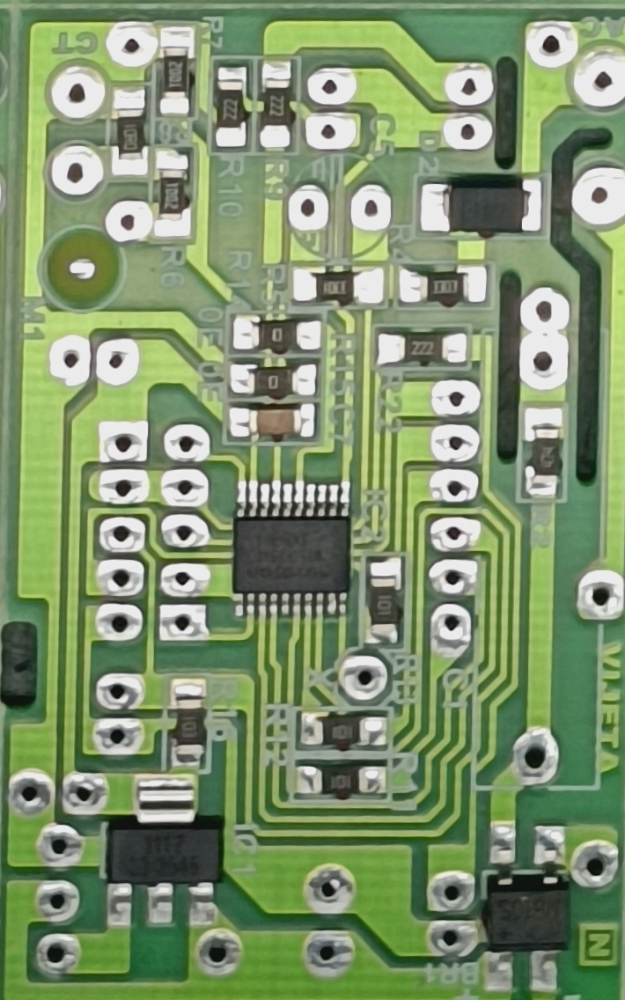

Detection 4: pcb-whole-images | conf: 0.90 | box: 132,1415 → 1304,2157
  Rotated 90° (was 1172x742, now 742x1172)
  Saved: /content/cropped_boxes/pcb-whole-images_box4_conf0.90.jpg


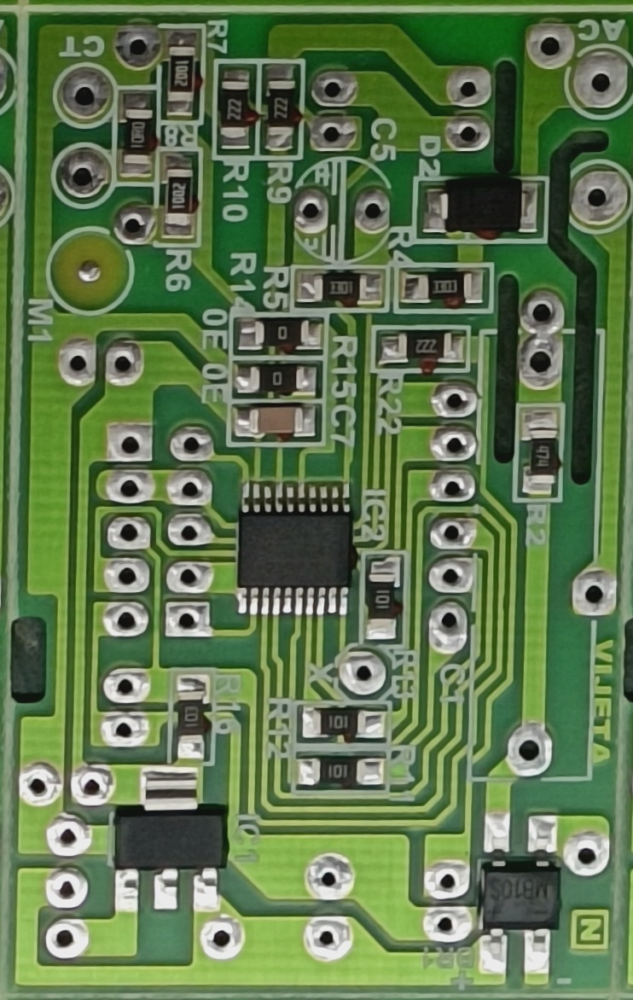

Detection 5: pcb-whole-images | conf: 0.84 | box: 141,678 → 1301,1417
  Rotated 90° (was 1160x739, now 739x1160)
  Saved: /content/cropped_boxes/pcb-whole-images_box5_conf0.84.jpg


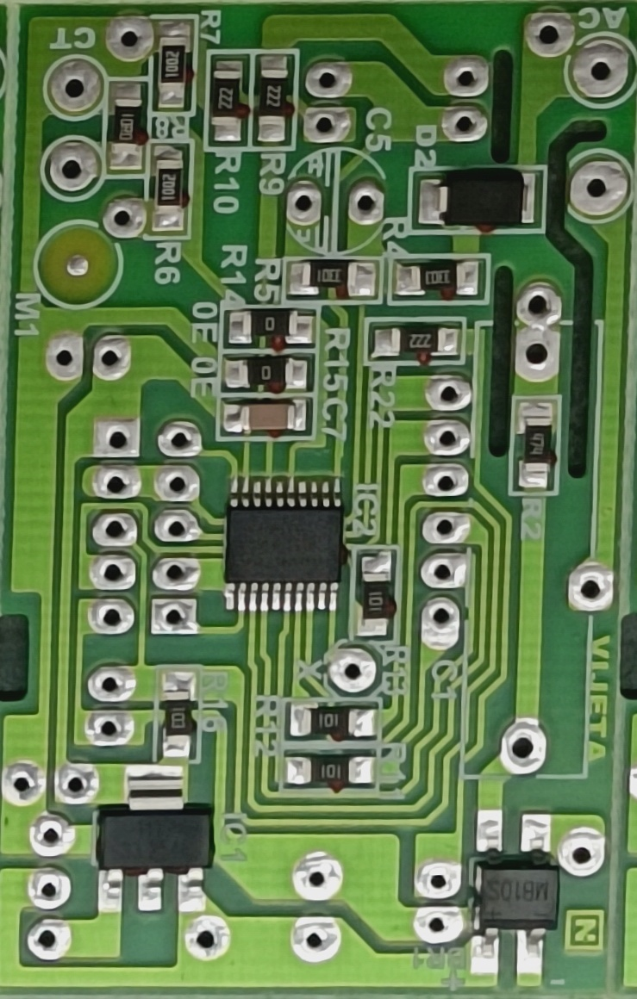

Detection 6: pcb-whole-images | conf: 0.78 | box: 1295,2903 → 2448,3604
  Rotated 90° (was 1153x701, now 701x1153)
  Saved: /content/cropped_boxes/pcb-whole-images_box6_conf0.78.jpg


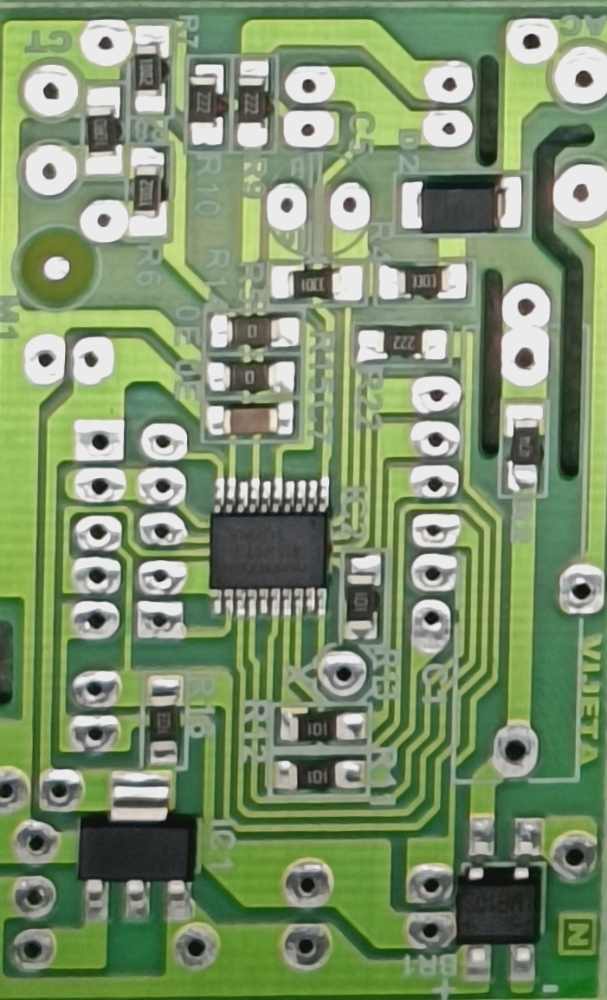

Detection 7: pcb-whole-images | conf: 0.77 | box: 1305,15 → 2457,726
  Rotated 90° (was 1152x711, now 711x1152)
  Saved: /content/cropped_boxes/pcb-whole-images_box7_conf0.77.jpg


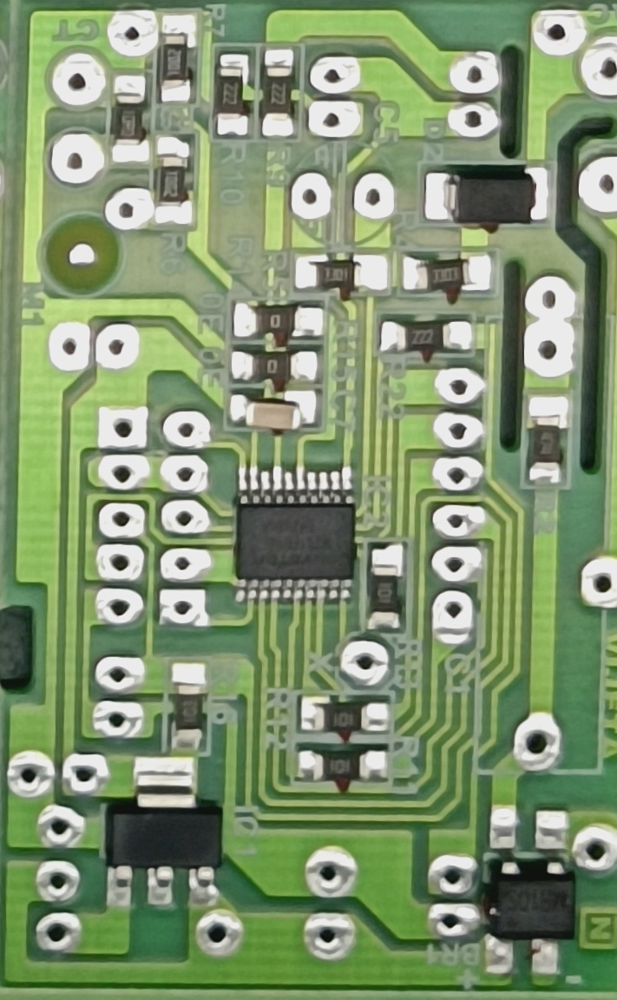

Detection 8: pcb-whole-images | conf: 0.77 | box: 129,2148 → 1296,2870
  Rotated 90° (was 1167x722, now 722x1167)
  Saved: /content/cropped_boxes/pcb-whole-images_box8_conf0.77.jpg


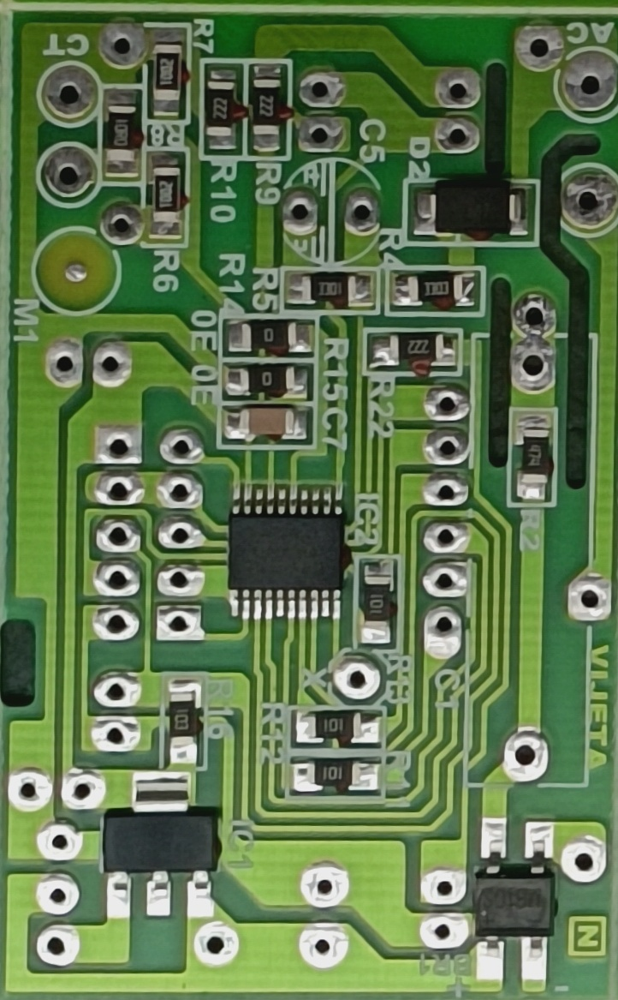

Detection 9: pcb-whole-images | conf: 0.71 | box: 131,6 → 1301,676
  Rotated 90° (was 1170x670, now 670x1170)
  Saved: /content/cropped_boxes/pcb-whole-images_box9_conf0.71.jpg


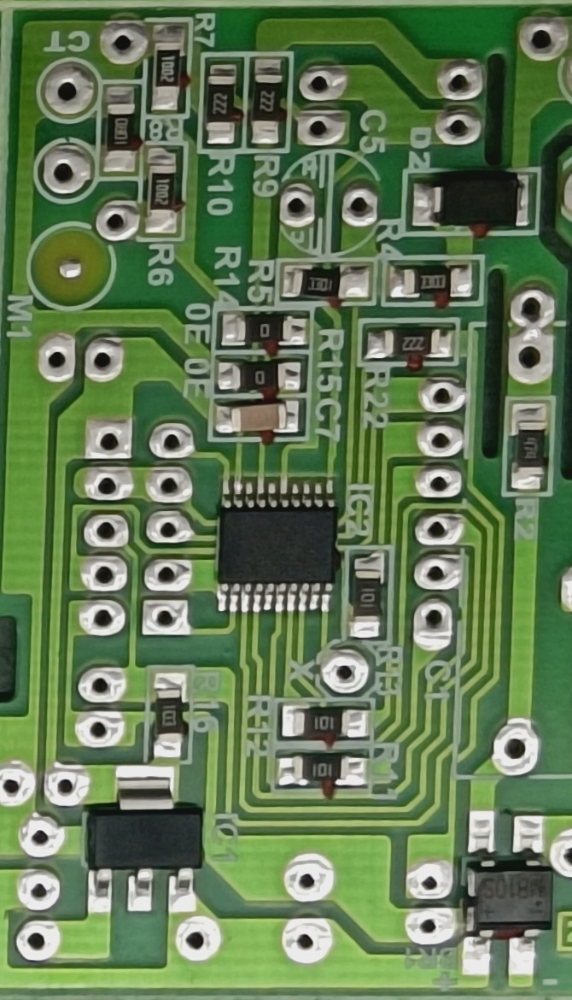

Detection 10: pcb-whole-images | conf: 0.65 | box: 147,2852 → 1297,3587
  Rotated 90° (was 1150x735, now 735x1150)
  Saved: /content/cropped_boxes/pcb-whole-images_box10_conf0.65.jpg


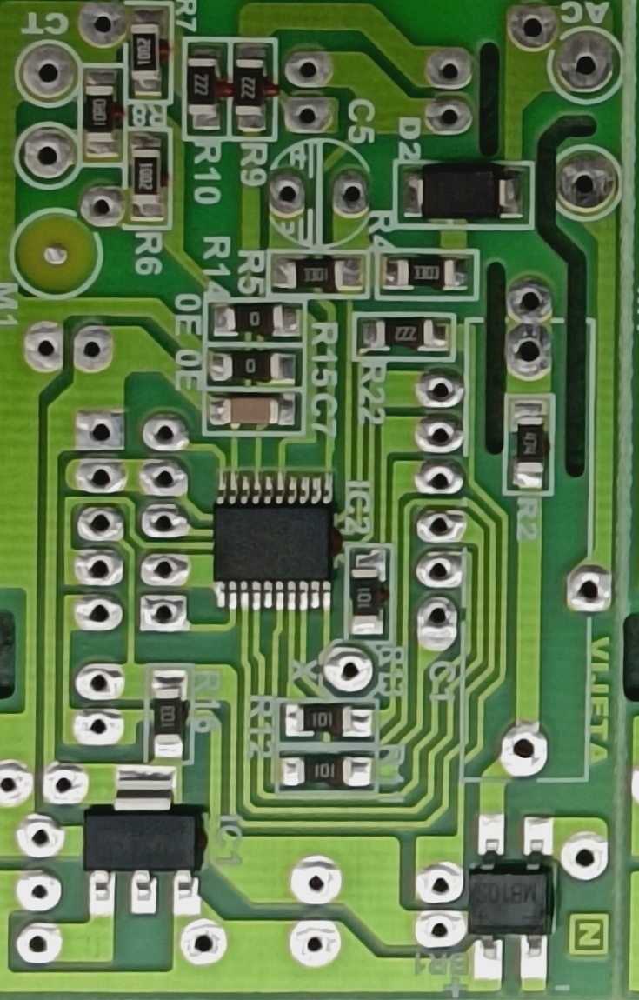


✅ 10 crops saved to /content/cropped_boxes
Paths (pass these to your next pipeline):
  /content/cropped_boxes/pcb-whole-images_box1_conf0.94.jpg
  /content/cropped_boxes/pcb-whole-images_box2_conf0.93.jpg
  /content/cropped_boxes/pcb-whole-images_box3_conf0.91.jpg
  /content/cropped_boxes/pcb-whole-images_box4_conf0.90.jpg
  /content/cropped_boxes/pcb-whole-images_box5_conf0.84.jpg
  /content/cropped_boxes/pcb-whole-images_box6_conf0.78.jpg
  /content/cropped_boxes/pcb-whole-images_box7_conf0.77.jpg
  /content/cropped_boxes/pcb-whole-images_box8_conf0.77.jpg
  /content/cropped_boxes/pcb-whole-images_box9_conf0.71.jpg
  /content/cropped_boxes/pcb-whole-images_box10_conf0.65.jpg


In [ ]:
# ── CELL: Detect → Crop → Save each box as separate image ─
from google.colab import files
from IPython.display import Image, display
import cv2
import os
import glob

# Upload image from PC
uploaded = files.upload()
img_path = list(uploaded.keys())[0]

# Run inference
results = model.predict(img_path, conf=0.5)

# Load original image with OpenCV
img = cv2.imread(img_path)

# Output folder for cropped boxes
crop_dir = "/content/cropped_boxes"
os.makedirs(crop_dir, exist_ok=True)

# Clear previous crops
for f in glob.glob(f"{crop_dir}/*.jpg"):
    os.remove(f)

cropped_paths = []

for result in results:
    boxes = result.boxes
    print(f"Total detections: {len(boxes)}\n")

    for i, box in enumerate(boxes):
        xyxy  = box.xyxy[0].tolist()
        conf  = box.conf[0].item()
        cls   = int(box.cls[0].item())
        label = result.names[cls]

        x1, y1, x2, y2 = [int(v) for v in xyxy]

        print(f"Detection {i+1}: {label} | conf: {conf:.2f} | box: {x1},{y1} → {x2},{y2}")

        # Crop the box
        crop = img[y1:y2, x1:x2]

        # ── Rotate to vertical if width > height ──────────
        h, w = crop.shape[:2]
        if w > h:
            crop = cv2.rotate(crop, cv2.ROTATE_90_CLOCKWISE)
            print(f"  Rotated 90° (was {w}x{h}, now {crop.shape[1]}x{crop.shape[0]})")
        else:
            print(f"  Already vertical ({w}x{h}), no rotation needed")

        # Save cropped image
        crop_path = f"{crop_dir}/{label}_box{i+1}_conf{conf:.2f}.jpg"
        cv2.imwrite(crop_path, crop)
        cropped_paths.append(crop_path)

        # Display each crop inline
        print(f"  Saved: {crop_path}")
        display(Image(crop_path))

print(f"\n✅ {len(cropped_paths)} crops saved to {crop_dir}")
print("Paths (pass these to your next pipeline):")
for p in cropped_paths:
    print(" ", p)

Upload your defect model (best-1.pt)...


Saving best_1.pt to best_1.pt

Running defect detection on 10 images...

Image 1/10: /content/cropped_boxes/pcb-whole-images_box1_conf0.89.jpg

image 1/1 /content/cropped_boxes/pcb-whole-images_box1_conf0.89.jpg: 640x416 (no detections), 43.0ms
Speed: 3.1ms preprocess, 43.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 416)
Results saved to /content/runs/defect_results
  → No defects detected


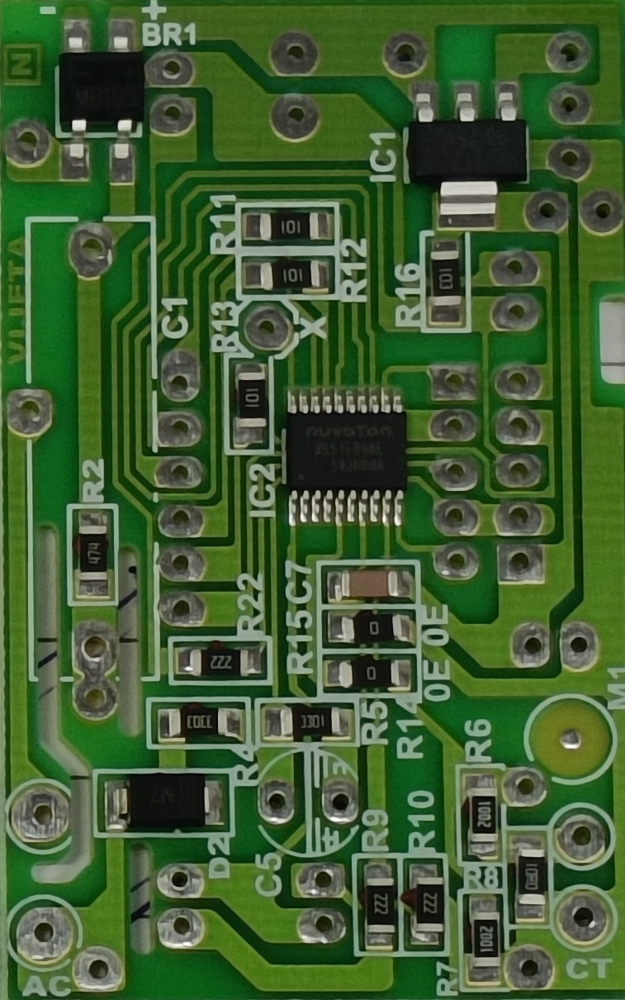

Image 2/10: /content/cropped_boxes/pcb-whole-images_box2_conf0.84.jpg

image 1/1 /content/cropped_boxes/pcb-whole-images_box2_conf0.84.jpg: 640x416 (no detections), 9.2ms
Speed: 3.4ms preprocess, 9.2ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 416)
Results saved to /content/runs/defect_results
  → No defects detected


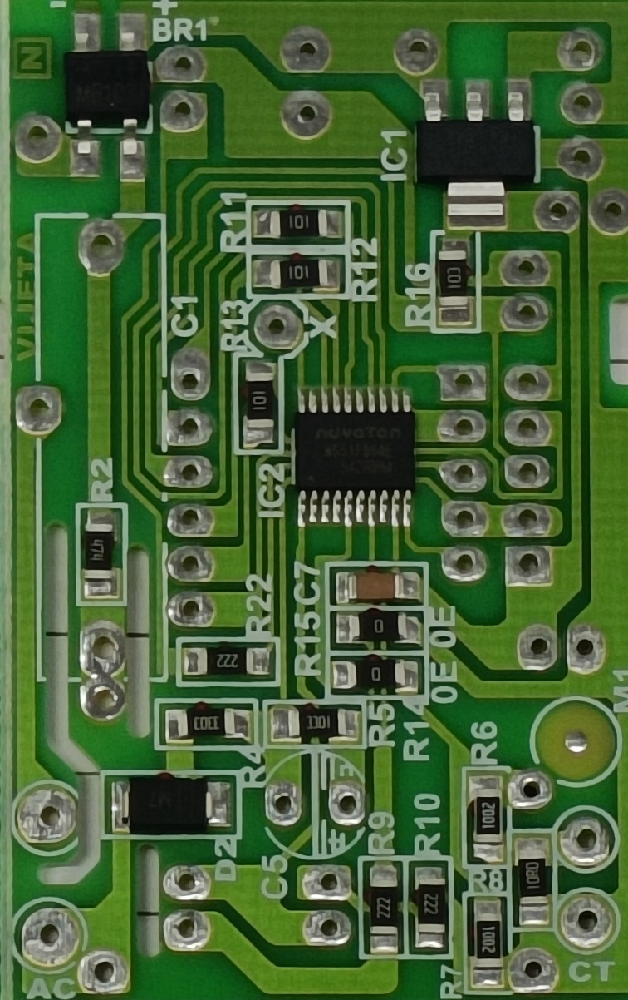

Image 3/10: /content/cropped_boxes/pcb-whole-images_box3_conf0.83.jpg

image 1/1 /content/cropped_boxes/pcb-whole-images_box3_conf0.83.jpg: 640x416 (no detections), 11.9ms
Speed: 3.9ms preprocess, 11.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 416)
Results saved to /content/runs/defect_results
  → No defects detected


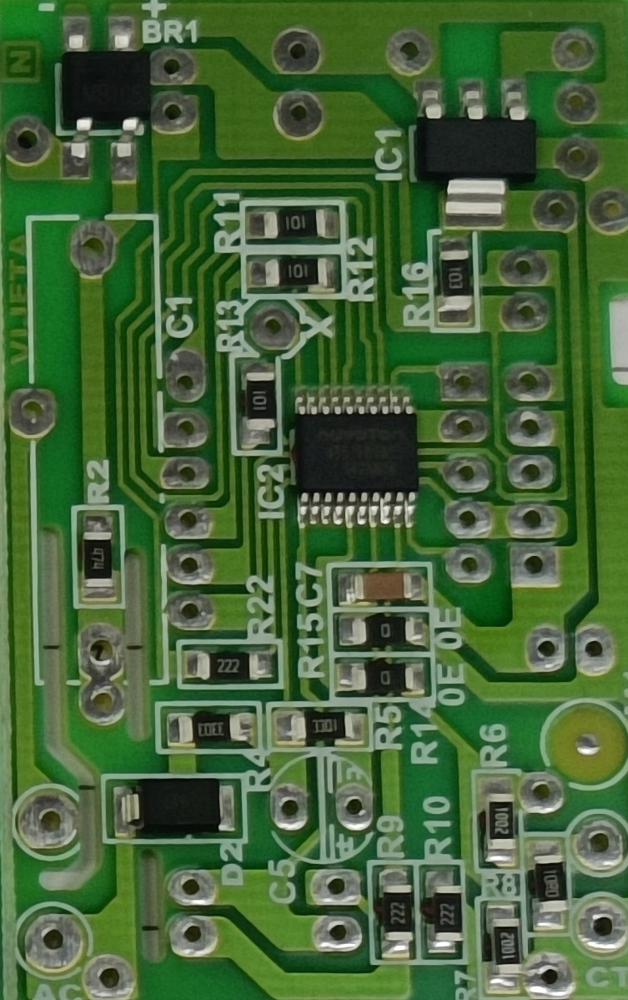

Image 4/10: /content/cropped_boxes/pcb-whole-images_box4_conf0.82.jpg

image 1/1 /content/cropped_boxes/pcb-whole-images_box4_conf0.82.jpg: 640x416 (no detections), 9.6ms
Speed: 3.2ms preprocess, 9.6ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 416)
Results saved to /content/runs/defect_results
  → No defects detected


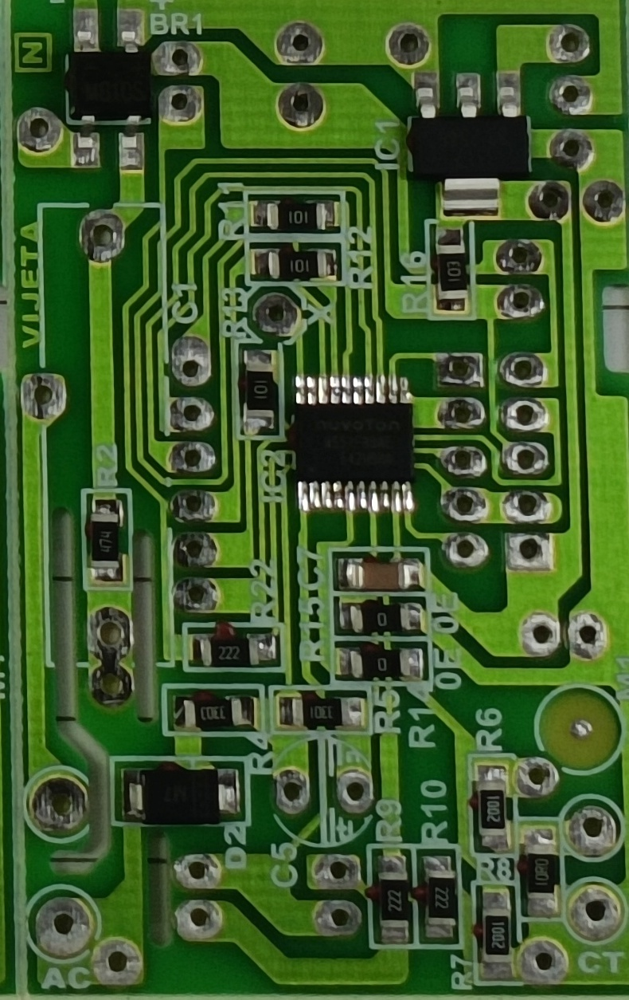

Image 5/10: /content/cropped_boxes/pcb-whole-images_box5_conf0.82.jpg

image 1/1 /content/cropped_boxes/pcb-whole-images_box5_conf0.82.jpg: 640x416 (no detections), 8.7ms
Speed: 3.6ms preprocess, 8.7ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 416)
Results saved to /content/runs/defect_results
  → No defects detected


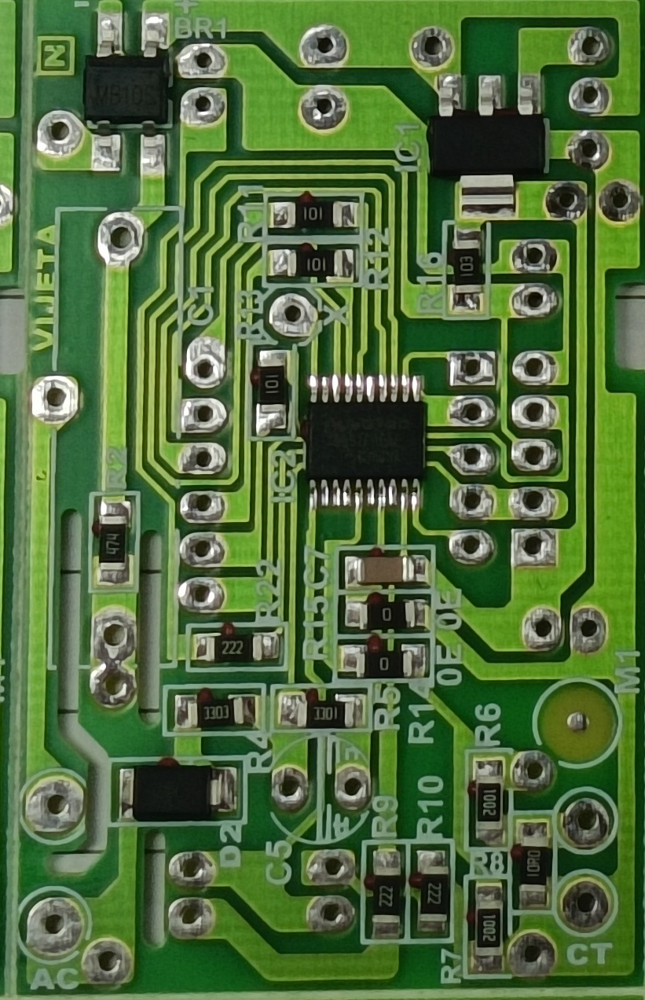

Image 6/10: /content/cropped_boxes/pcb-whole-images_box6_conf0.79.jpg

image 1/1 /content/cropped_boxes/pcb-whole-images_box6_conf0.79.jpg: 640x416 (no detections), 10.9ms
Speed: 3.2ms preprocess, 10.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 416)
Results saved to /content/runs/defect_results
  → No defects detected


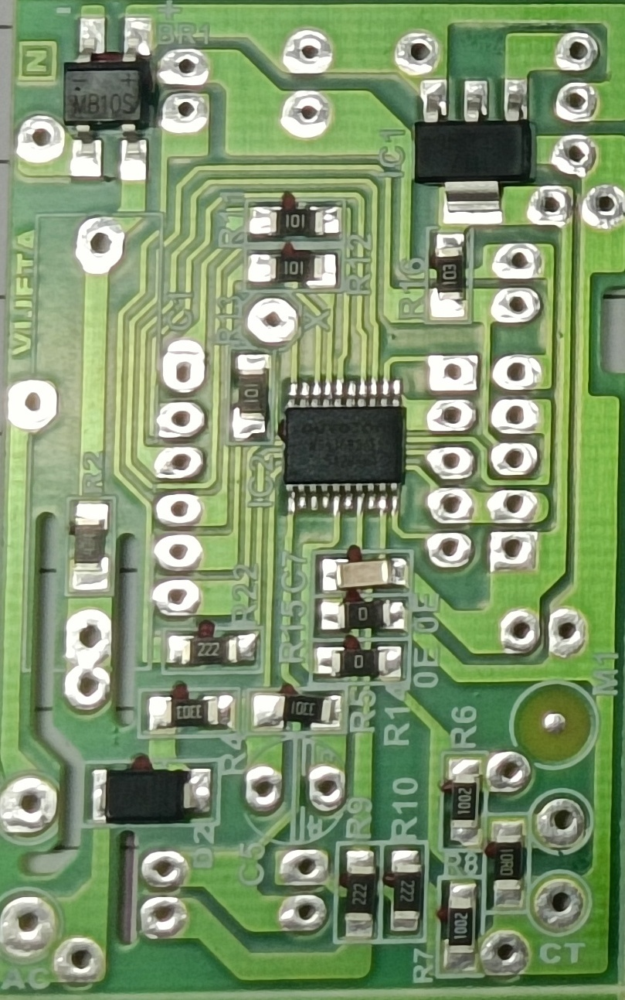

Image 7/10: /content/cropped_boxes/pcb-whole-images_box7_conf0.78.jpg

image 1/1 /content/cropped_boxes/pcb-whole-images_box7_conf0.78.jpg: 640x416 (no detections), 10.1ms
Speed: 3.9ms preprocess, 10.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 416)
Results saved to /content/runs/defect_results
  → No defects detected


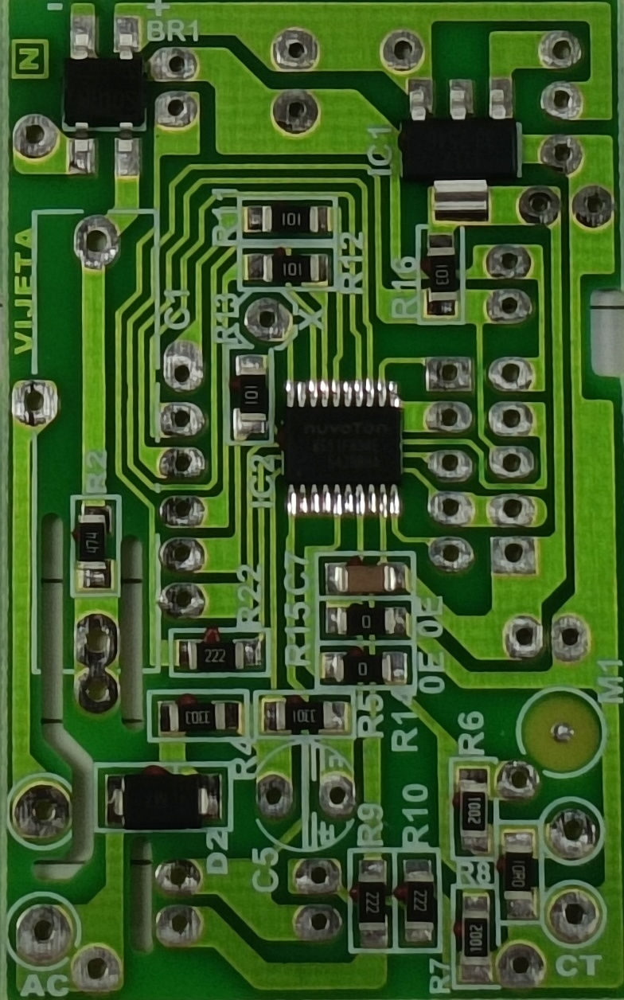

Image 8/10: /content/cropped_boxes/pcb-whole-images_box8_conf0.77.jpg

image 1/1 /content/cropped_boxes/pcb-whole-images_box8_conf0.77.jpg: 640x416 (no detections), 9.5ms
Speed: 3.7ms preprocess, 9.5ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 416)
Results saved to /content/runs/defect_results
  → No defects detected


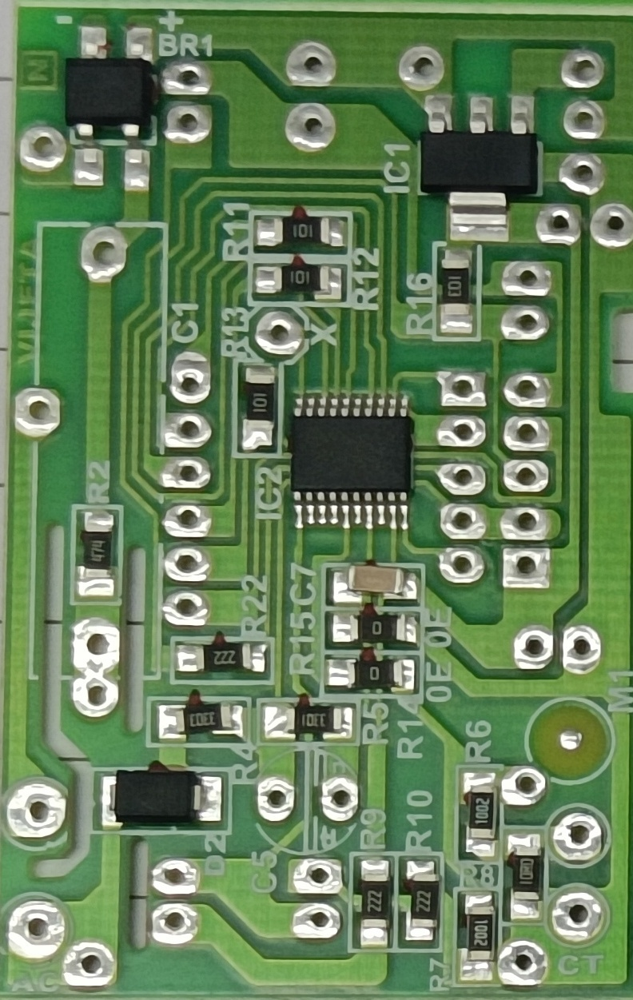

Image 9/10: /content/cropped_boxes/pcb-whole-images_box9_conf0.77.jpg

image 1/1 /content/cropped_boxes/pcb-whole-images_box9_conf0.77.jpg: 640x416 (no detections), 8.4ms
Speed: 3.8ms preprocess, 8.4ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 416)
Results saved to /content/runs/defect_results
  → No defects detected


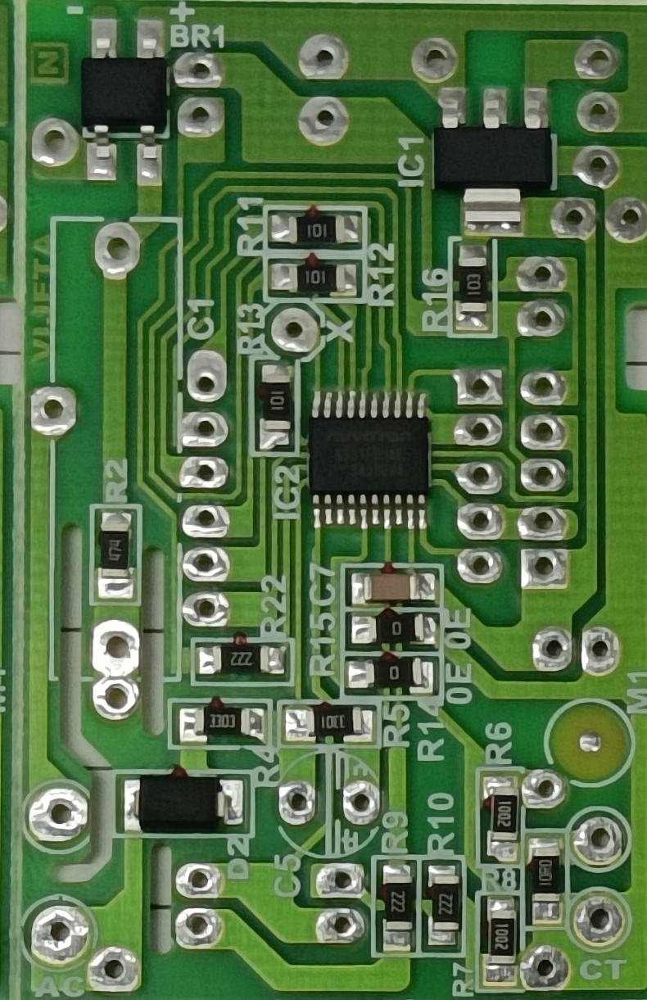

Image 10/10: /content/cropped_boxes/pcb-whole-images_box10_conf0.67.jpg

image 1/1 /content/cropped_boxes/pcb-whole-images_box10_conf0.67.jpg: 640x416 (no detections), 10.5ms
Speed: 3.5ms preprocess, 10.5ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 416)
Results saved to /content/runs/defect_results
  → No defects detected


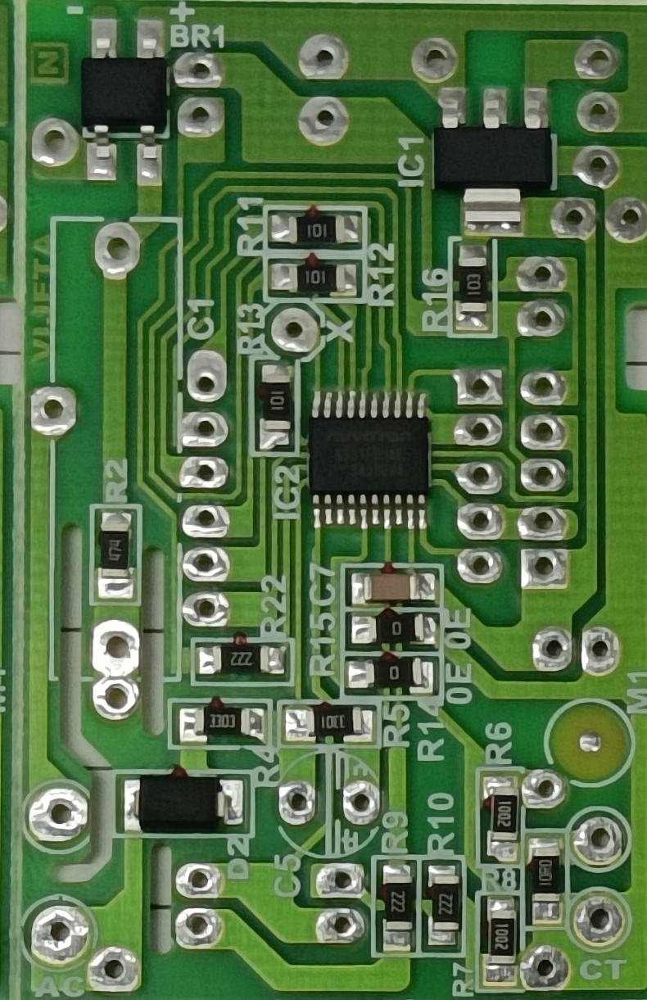


✅ All images processed!


In [ ]:
# ── NEXT CELL: Feed cropped images into defect model ──────
from google.colab import files
from IPython.display import Image, display
from ultralytics import YOLO

# Upload defect model (best-1.pt)
print("Upload your defect model (best-1.pt)...")
model_upload = files.upload()
defect_model = YOLO(list(model_upload.keys())[0])

print(f"\nRunning defect detection on {len(cropped_paths)} images...\n")

# Feed each cropped image one by one
for i, crop_path in enumerate(cropped_paths):
    print(f"{'='*40}")
    print(f"Image {i+1}/{len(cropped_paths)}: {crop_path}")

    result = defect_model.predict(crop_path, conf=0.4, save=True,
                                   project="/content/runs",
                                   name="defect_results",
                                   exist_ok=True)

    # Print detections
    if len(result[0].boxes) == 0:
        print("  → No defects detected")
    else:
        for box in result[0].boxes:
            label = result[0].names[int(box.cls[0].item())]
            conf  = box.conf[0].item()
            x1,y1,x2,y2 = [int(v) for v in box.xyxy[0].tolist()]
            print(f"  → {label} | conf: {conf:.2f} | box: {x1},{y1} → {x2},{y2}")

    # Display annotated output
    saved = sorted(glob.glob("/content/runs/defect_results/**/*.jpg", recursive=True))
    if saved:
        display(Image(saved[-1]))

print("\n✅ All images processed!")